<a href="https://colab.research.google.com/github/paula-rico/coder_final/blob/main/Airbnb%20Copia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install basemap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip3 install pandas_profiling --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
#Importamos las librerias
import pandas as pd
import pandas_profiling
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from seaborn import boxplot
from matplotlib.ticker import FormatStrFormatter
import plotly.express as px
import plotly.graph_objects as go
from mpl_toolkits.basemap import Basemap
import datetime as dt
import io

In [5]:
%matplotlib notebook
%matplotlib inline



In [6]:
#Importamos las librerias Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import preprocessing
from sklearn import tree as trees
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import RadiusNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import export_graphviz
from six import StringIO 
import pydotplus as pydotplus
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import r2_score

In [7]:
pd.set_option('display.max_rows', 500) 
pd.set_option('display.max_columns', 500) 
pd.set_option('display.width', 1000)

## Dataset

En el presente trabajo se desarrolla el analisis del dataset de la empresa Airbnb, una empresa dedicada al alquiler de propiedades primariamente para periodos vacacionales. La informacion corresponde a la ciudad de Nueva York e incluye los detalles de la publicacion, caracteristicas del inmueble, costos y reseñas.  
Fuente: https://www.kaggle.com/datasets/arianazmoudeh/airbnbopendata

## Data Load

En el apartado siguiente se desarrolla el analisis a nivel general del dataset y las principales medidas estadisticas

In [8]:
from google.colab import files
uploaded = files.upload()

Saving Airbnb_Open_Data.csv to Airbnb_Open_Data (2).csv


In [9]:
#Lectura del dataframe
data = pd.read_csv(io.BytesIO(uploaded['Airbnb_Open_Data.csv']),dtype='unicode')
data.head()


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,US,FALSE,strict,Private room,2020,$966,$193,10,9,10/19/2021,0.21,4,6,286,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,US,FALSE,moderate,Entire home/apt,2007,$142,$28,30,45,5/21/2022,0.38,4,2,228,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.9419,United States,US,TRUE,flexible,Private room,2005,$620,$124,3,0,NaN,NaN,5,1,352,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,US,TRUE,moderate,Entire home/apt,2005,$368,$74,30,270,7/5/2019,4.64,4,1,322,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,US,FALSE,moderate,Entire home/apt,2009,$204,$41,10,9,11/19/2018,0.1,3,1,289,"Please no smoking in the house, porch or on th...",NaN


In [10]:
#Veamos el shape
data.shape

(102599, 26)

In [11]:
#Totalidad de registros por columnas
data.count()

id                                102599
NAME                              102349
host id                           102599
host_identity_verified            102310
host name                         102193
neighbourhood group               102570
neighbourhood                     102583
lat                               102591
long                              102591
country                           102067
country code                      102468
instant_bookable                  102494
cancellation_policy               102523
room type                         102599
Construction year                 102385
price                             102352
service fee                       102326
minimum nights                    102190
number of reviews                 102416
last review                        86706
reviews per month                  86720
review rate number                102273
calculated host listings count    102280
availability 365                  102151
house_rules     

In [12]:
#Tipo de dato de cada columna
data.dtypes

id                                object
NAME                              object
host id                           object
host_identity_verified            object
host name                         object
neighbourhood group               object
neighbourhood                     object
lat                               object
long                              object
country                           object
country code                      object
instant_bookable                  object
cancellation_policy               object
room type                         object
Construction year                 object
price                             object
service fee                       object
minimum nights                    object
number of reviews                 object
last review                       object
reviews per month                 object
review rate number                object
calculated host listings count    object
availability 365                  object
house_rules     

In [13]:
#Principales medidas estadisticas
data.describe().T

,count,unique,top,freq
id,102599,102058,6044940,2
NAME,102349,61281,Home away from home,33
host id,102599,102057,38729751923,2
host_identity_verified,102310,2,unconfirmed,51200
host name,102193,13190,Michael,881
neighbourhood group,102570,7,Manhattan,43792
neighbourhood,102583,224,Bedford-Stuyvesant,7937
lat,102591,21991,40.76411,36
long,102591,17774,-73.99371,44
country,102067,1,United States,102067


In [14]:
#Listado columnas
data.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name', 'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country', 'country code', 'instant_bookable', 'cancellation_policy', 'room type', 'Construction year', 'price', 'service fee', 'minimum nights', 'number of reviews', 'last review', 'reviews per month', 'review rate number', 'calculated host listings count', 'availability 365', 'house_rules', 'license'], dtype='object')

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype 
---  ------                          --------------   ----- 
 0   id                              102599 non-null  object
 1   NAME                            102349 non-null  object
 2   host id                         102599 non-null  object
 3   host_identity_verified          102310 non-null  object
 4   host name                       102193 non-null  object
 5   neighbourhood group             102570 non-null  object
 6   neighbourhood                   102583 non-null  object
 7   lat                             102591 non-null  object
 8   long                            102591 non-null  object
 9   country                         102067 non-null  object
 10  country code                    102468 non-null  object
 11  instant_bookable                102494 non-null  object
 12  cancellation_policy           

## Diccionario

En el presente apartado se detalla la informacion que se encuentra en cada columna y el tipo de dato de acuerdo a su naturaleza

'id': Airbnb ID -> Integer  
'NAME': Nombre de la publicacion -> Text  
'host id': Airbnb ID del anfitrion -> Integer  
'host_identity_verified': Verificacion de la identidad del anfitrion -> Boolean  
'host name': Nombre del anfitrion -> Text  
'neighbourhood group': Vecindario geocodificado usando latitud y longitud -> Text  
'neighbourhood': Vecindario -> Text  
'lat': Latitud -> Float  
'long': Longitud -> Float  
'country': Pais -> Text  
'country code': Codigo Pais -> Text  
'instant_bookable': Posibilidad de reservar sin aceptacion del anfitrion -> Boolean  
'cancellation_policy': Politica de cancelacion de reserva -> Text  
'room type': Tipo de habitacion (Entire home/apt-Private Room-Shared Room) -> Text  
'Construction year': Año de construccion de la propiedad -> Integer  
'price': Precio -> Float  
'service fee': Comision -> Float  
'minimum nights': Minimo de noches -> Integer  
'number of reviews': Numero de reseñas -> Integer  
'last review': Ultima reseña -> Date  
'reviews per month': Promedio de cantidad de reseñas por mes del aviso -> Float  
'review rate number': Valoracion de las reseñas -> Integer  
'calculated host listings count': Cantidad de publicaciones que posee el anfitrion -> Integer  
'availability 365': Cantidad de dias disponible en los proximos 365 dias -> Integer  
'house_rules': Reglas de la propiedad -> Text  
'license': Numero de registro -> Text  



## Data Wrangling

En esta seccion se eliminaran las columnas y filas innecesarias, asi como tambien reemplazar nulos y realizar los cambios necesarios para convertir los valores a los tipos de datos correctos

In [16]:
#Eliminar columnas innecesarias
data=data.drop(columns=['NAME','host id','host_identity_verified','host name','country','calculated host listings count','license','house_rules'])

In [17]:
#Listado columnas
data.columns

Index(['id', 'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country code', 'instant_bookable', 'cancellation_policy', 'room type', 'Construction year', 'price', 'service fee', 'minimum nights', 'number of reviews', 'last review', 'reviews per month', 'review rate number', 'availability 365'], dtype='object')

In [18]:
#Mostrar los primeros 20 registros
data.head(20)

,id,neighbourhood group,neighbourhood,lat,long,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,availability 365
0,1001254,Brooklyn,Kensington,40.64749,-73.97237,US,FALSE,strict,Private room,2020,$966,$193,10,9,10/19/2021,0.21,4,286
1,1002102,Manhattan,Midtown,40.75362,-73.98377,US,FALSE,moderate,Entire home/apt,2007,$142,$28,30,45,5/21/2022,0.38,4,228
2,1002403,Manhattan,Harlem,40.80902,-73.9419,US,TRUE,flexible,Private room,2005,$620,$124,3,0,NaN,NaN,5,352
3,1002755,Brooklyn,Clinton Hill,40.68514,-73.95976,US,TRUE,moderate,Entire home/apt,2005,$368,$74,30,270,7/5/2019,4.64,4,322
4,1003689,Manhattan,East Harlem,40.79851,-73.94399,US,FALSE,moderate,Entire home/apt,2009,$204,$41,10,9,11/19/2018,0.1,3,289
5,1004098,Manhattan,Murray Hill,40.74767,-73.975,US,TRUE,flexible,Entire home/apt,2013,$577,$115,3,74,6/22/2019,0.59,3,374
6,1004650,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,US,FALSE,moderate,Private room,2015,$71,$14,45,49,10/5/2017,0.4,5,224
7,1005202,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,US,FALSE,moderate,Private room,2009,"$1,060",$212,45,49,10/5/2017,0.4,5,219
8,1005754,Manhattan,Hell's Kitchen,40.76489,-73.98493,US,TRUE,strict,Private room,2005,"$1,018",$204,2,430,6/24/2019,3.47,3,180
9,1006307,Manhattan,Upper West Side,40.80178,-73.96723,US,FALSE,strict,Private room,2015,$291,$58,2,118,7/21/2017,0.99,5,375


In [19]:
#Reemplazar texto TRUE/FALSE por valores booleanos
data['instant_bookable']=data['instant_bookable'].replace(['FALSE'], False)
data['instant_bookable']=data['instant_bookable'].replace(['TRUE'], True)

In [20]:
data['price']

0           $966 
1           $142 
2           $620 
3           $368 
4           $204 
           ...   
102594      $844 
102595      $837 
102596      $988 
102597      $546 
102598    $1,032 
Name: price, Length: 102599, dtype: object

In [21]:
#Reemplazar signo '$' y ',' para convertir a numero
data['price'] = data['price'].str.replace(',', '')
data['price'] = data['price'].str.replace('$', '',regex=True)
data['price']

0          966 
1          142 
2          620 
3          368 
4          204 
          ...  
102594     844 
102595     837 
102596     988 
102597     546 
102598    1032 
Name: price, Length: 102599, dtype: object

In [22]:
#Reemplazar signo '$' y ',' para convertir a numero
data['service fee'] = data['service fee'].str.replace(',', '')
data['service fee'] = data['service fee'].str.replace('$', '',regex=True)
data['service fee']

0         193 
1          28 
2         124 
3          74 
4          41 
          ... 
102594    169 
102595    167 
102596    198 
102597    109 
102598    206 
Name: service fee, Length: 102599, dtype: object

In [23]:
#Contar valores nulos
data.isna().sum()

id                         0
neighbourhood group       29
neighbourhood             16
lat                        8
long                       8
country code             131
instant_bookable         105
cancellation_policy       76
room type                  0
Construction year        214
price                    247
service fee              273
minimum nights           409
number of reviews        183
last review            15893
reviews per month      15879
review rate number       326
availability 365         448
dtype: int64

In [24]:
data['country code'].unique()

array(['US', nan], dtype=object)

In [25]:
#Listar todos los items que no tienen pais para identificar por el vecindario si son todos de US
null=data[data['country code'].isnull()]
null

,id,neighbourhood group,neighbourhood,lat,long,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,availability 365
16,1010173,Brooklyn,Williamsburg,40.70837,-73.95352,NaN,NaN,moderate,Entire home/apt,2009,778,NaN,2,148,6/29/2019,1.2,3,197
17,1010725,Brooklyn,Fort Greene,40.69169,-73.97185,NaN,NaN,flexible,Entire home/apt,2006,656,NaN,2,198,6/28/2019,1.72,5,96
18,1011277,manhatan,Chelsea,40.74192,-73.99501,NaN,NaN,moderate,Private room,2008,460,NaN,1,260,7/1/2019,2.12,3,325
19,1011830,Brooklyn,Crown Heights,40.67592,-73.94694,NaN,NaN,moderate,Entire home/apt,2004,1095,NaN,3,53,6/22/2019,4.44,5,345
20,1012382,Manhattan,East Harlem,40.79685,-73.94872,NaN,NaN,moderate,Entire home/apt,2013,281,56,7,0,NaN,NaN,3,347
21,1012934,Brooklyn,Williamsburg,40.71842,-73.95718,NaN,NaN,flexible,Entire home/apt,2016,477,95,3,9,12/28/2021,0.07,3,193
22,1013487,Brooklyn,Park Slope,40.68069,-73.97706,NaN,NaN,moderate,Private room,2013,133,27,2,130,7/1/2019,1.09,4,54
23,1014039,Brooklyn,Park Slope,40.67989,-73.97798,NaN,NaN,moderate,Private room,2017,1050,210,1,39,1/1/2019,0.37,3,9
24,1014591,Brooklyn,Park Slope,40.68001,-73.97865,NaN,NaN,strict,Private room,2005,816,163,2,71,7/2/2019,0.61,4,344
25,1015144,Brooklyn,Bedford-Stuyvesant,40.68371,-73.94028,NaN,NaN,strict,Entire home/apt,2006,1175,235,2,88,6/19/2019,0.73,4,372


In [26]:
#Listar todos los items que no tienen neighbourhood group para completarlo de acuerdo al valor en neighbourhood
null2=data[data['neighbourhood group'].isnull()]
null2

,id,neighbourhood group,neighbourhood,lat,long,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,availability 365
74,1042206,NaN,Washington Heights,40.83139,-73.94095,US,True,moderate,Private room,2011,571,114,2,49,6/18/2019,1.6,2,NaN
75,1042759,NaN,Clinton Hill,40.68346,-73.96374,US,True,strict,Private room,2014,398,80,2,105,6/26/2019,0.92,1,NaN
76,1043311,NaN,East Village,40.72828,-73.98801,US,False,strict,Entire home/apt,2018,618,124,5,21,1/2/2019,0.2,4,NaN
77,1043863,NaN,Upper East Side,40.76865,-73.95058,US,False,strict,Private room,2007,116,23,1,142,7/6/2019,1.5,4,NaN
78,1044415,NaN,Woodside,40.75038,-73.90334,US,True,flexible,Private room,2012,54,11,30,25,NaN,0.22,2,NaN
90,1051043,NaN,Williamsburg,40.71156,-73.96218,US,False,moderate,Private room,2015,266,53,3,174,6/22/2019,1.54,5,NaN
91,1051595,NaN,Bushwick,40.70032,-73.9383,US,False,moderate,Private room,2012,728,146,4,24,NaN,0.28,5,NaN
92,1052148,NaN,Prospect Heights,40.68233,-73.97261,US,False,flexible,Entire home/apt,2021,583,117,4,166,6/27/2019,3.4,2,NaN
148,1083076,NaN,East Village,40.72354,-73.98295,US,False,strict,Entire home/apt,2003,NaN,119,3,30,6/17/2019,0.28,5,344
161,1090256,NaN,Williamsburg,40.71088,-73.95055,NaN,NaN,NaN,Private room,2022,1020,204,4,202,5/28/2019,1.86,5,377


In [27]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Washington Heights'
data[data['neighbourhood'] == 'Washington Heights']['neighbourhood group'].unique()

array([nan, 'Manhattan'], dtype=object)

In [28]:
#Reemplazar neighbourhood para todas las lineas de Washington Heights por Manhattan
data.loc[data["neighbourhood"] == "Washington Heights", "neighbourhood group"] = "Manhattan"

In [29]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Clinton Hill'
data[data['neighbourhood'] == 'Clinton Hill']['neighbourhood group'].unique()


array(['Brooklyn', nan], dtype=object)

In [30]:
#Reemplazar neighbourhood para todas las lineas de Clinton Hill por Brooklyn

data.loc[data["neighbourhood"] == "Clinton Hill", "neighbourhood group"] = "Brooklyn"

In [31]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'East Village'
data[data['neighbourhood'] == 'East Village']['neighbourhood group'].unique()


array(['Manhattan', nan], dtype=object)

In [32]:
#Reemplazar neighbourhood para todas las lineas de East Village por Manhattan

data.loc[data["neighbourhood"] == "East Village", "neighbourhood group"] = "Manhattan"

In [33]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Upper East Side'
data[data['neighbourhood'] == 'Upper East Side']['neighbourhood group'].unique()


array(['Manhattan', nan], dtype=object)

In [34]:
#Reemplazar neighbourhood para todas las lineas de Upper East Side por Manhattan

data.loc[data["neighbourhood"] == "Upper East Side", "neighbourhood group"] = "Manhattan"

In [35]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Woodside'
data[data['neighbourhood'] == 'Woodside']['neighbourhood group'].unique()

array([nan, 'Queens'], dtype=object)

In [36]:
#Reemplazar neighbourhood para todas las lineas de Woodside por Queens

data.loc[data["neighbourhood"] == "Woodside", "neighbourhood group"] = "Queens"

In [37]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Williamsburg'
data[data['neighbourhood'] == 'Williamsburg']['neighbourhood group'].unique()

array(['Brooklyn', nan], dtype=object)

In [38]:
#Reemplazar neighbourhood para todas las lineas de Williamsburg por Brooklyn

data.loc[data["neighbourhood"] == "Williamsburg", "neighbourhood group"] = "Brooklyn"

In [39]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Bushwick'
data[data['neighbourhood'] == 'Bushwick']['neighbourhood group'].unique()


array(['Brooklyn', nan], dtype=object)

In [40]:
#Reemplazar neighbourhood para todas las lineas de Bushwick por Brooklyn

data.loc[data["neighbourhood"] == "Bushwick", "neighbourhood group"] = "Brooklyn"

In [41]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Prospect Heights'
data[data['neighbourhood'] == 'Prospect Heights']['neighbourhood group'].unique()

array(['Brooklyn', nan], dtype=object)

In [42]:
#Reemplazar neighbourhood para todas las lineas de Prospect Heights por Brooklyn

data.loc[data["neighbourhood"] == "Prospect Heights", "neighbourhood group"] = "Brooklyn"

In [43]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Chelsea'
data[data['neighbourhood'] == 'Chelsea']['neighbourhood group'].unique()

array(['manhatan', 'Manhattan', nan], dtype=object)

In [44]:
#Reemplazar neighbourhood para todas las lineas de Chelsea por Manhattan

data.loc[data["neighbourhood"] == "Chelsea", "neighbourhood group"] = "Manhattan"

In [45]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'East Harlem'
data[data['neighbourhood'] == 'East Harlem']['neighbourhood group'].unique()

array(['Manhattan', nan], dtype=object)

In [46]:
#Reemplazar neighbourhood para todas las lineas de East Harlem por Manhattan

data.loc[data["neighbourhood"] == "East Harlem", "neighbourhood group"] = "Manhattan"

In [47]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Eastchester'
data[data['neighbourhood'] == 'Eastchester']['neighbourhood group'].unique()

array([nan, 'Bronx'], dtype=object)

In [48]:
#Reemplazar neighbourhood para todas las lineas de Eastchester por Bronx

data.loc[data["neighbourhood"] == "Eastchester", "neighbourhood group"] = "Bronx"

In [49]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Harlem'
data[data['neighbourhood'] == 'Harlem']['neighbourhood group'].unique()

array(['Manhattan', nan], dtype=object)

In [50]:
#Reemplazar neighbourhood para todas las lineas de Harlem por Manhattan

data.loc[data["neighbourhood"] == "Harlem", "neighbourhood group"] = "Manhattan"

In [51]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Chinatown'
data[data['neighbourhood'] == 'Chinatown']['neighbourhood group'].unique()

array(['Manhattan', nan], dtype=object)

In [52]:
#Reemplazar neighbourhood para todas las lineas de Chinatown por Manhattan

data.loc[data["neighbourhood"] == "Chinatown", "neighbourhood group"] = "Manhattan"

In [53]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Queens Village'
data[data['neighbourhood'] == 'Queens Village']['neighbourhood group'].unique()

array([nan, 'Queens'], dtype=object)

In [54]:
#Reemplazar neighbourhood para todas las lineas de Queens Village por Queens

data.loc[data["neighbourhood"] == "Queens Village", "neighbourhood group"] = "Queens"

In [55]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Bedford-Stuyvesant'
data[data['neighbourhood'] == 'Bedford-Stuyvesant']['neighbourhood group'].unique()

array(['Brooklyn', nan], dtype=object)

In [56]:
#Reemplazar neighbourhood para todas las lineas de Bedford-Stuyvesant por Brooklyn

data.loc[data["neighbourhood"] == "Bedford-Stuyvesant", "neighbourhood group"] = "Brooklyn"

In [57]:
#Obtener el 'neighbourhood group' de 'neighbourhood' 'Upper West Side'
data[data['neighbourhood'] == 'Upper West Side']['neighbourhood group'].unique()

array(['Manhattan', nan], dtype=object)

In [58]:
#Reemplazar neighbourhood para todas las lineas de Upper West Side por Manhattan

data.loc[data["neighbourhood"] == "Upper West Side", "neighbourhood group"] = "Manhattan"

In [59]:
#Eliminar filas sin neighbourhood (15) ni latitud (8), la cantidad no es significativa
data = data[data['neighbourhood'].notna()]
data = data[data['lat'].notna()]


In [60]:
#Rellenar filas sin pais
data['country code'] = data['country code'].fillna('US')

In [61]:
#Eliminar filas sin precio por no ser relevantes para el analisis
data = data[data['price'].notna()]


In [62]:
#Rellenar filas sin data en Cancellation policy
data['cancellation_policy'] = data['cancellation_policy'].fillna('Sin Datos')


In [63]:
#Reemplazar nulos en columnas numericas por cero
data['Construction year'] = data['Construction year'].fillna('0')
data['minimum nights'] = data['minimum nights'].fillna('0')
data['number of reviews'] = data['number of reviews'].fillna('0')
data['review rate number'] = data['review rate number'].fillna('0')
data['availability 365'] = data['availability 365'].fillna('0')
data['service fee'] = data['service fee'].fillna('0')
data['reviews per month'] = data['reviews per month'].fillna('0')

In [64]:
#Cambiar el tipo de datos de las columnas restantes

data['id'] = data['id'].astype('int')
data['neighbourhood group'] = data['neighbourhood group'].astype('string')
data['neighbourhood'] = data['neighbourhood'].astype('string')
data['lat'] = data['lat'].astype('float')
data['long'] = data['long'].astype('float')
data['country code'] = data['country code'].astype('string')
data['instant_bookable'] = data['instant_bookable'].astype('bool')
data['cancellation_policy'] = data['cancellation_policy'].astype('string')
data['room type'] = data['room type'].astype('string')
data['Construction year'] = data['Construction year'].astype('int')
data['price'] = data['price'].astype('float')
data['service fee'] = data['service fee'].astype('float')
data['minimum nights'] = data['minimum nights'].astype('int')
data['number of reviews'] = data['number of reviews'].astype('int')
data['last review'] = data['last review'].astype('string')
data['reviews per month'] = data['reviews per month'].astype('float')
data['review rate number'] = data['review rate number'].astype('int')
data['availability 365'] = data['availability 365'].astype('int')




In [65]:
#data['last review']=data['last review'].values.astype('datetime64[D]')
data['last review'] = pd.to_datetime(data['last review'])

In [66]:
#Tipo de dato de cada columna
data.dtypes

id                              int64
neighbourhood group            string
neighbourhood                  string
lat                           float64
long                          float64
country code                   string
instant_bookable                 bool
cancellation_policy            string
room type                      string
Construction year               int64
price                         float64
service fee                   float64
minimum nights                  int64
number of reviews               int64
last review            datetime64[ns]
reviews per month             float64
review rate number              int64
availability 365                int64
dtype: object

In [67]:
#Contar valores nulos
data.isna().sum()

id                         0
neighbourhood group        0
neighbourhood              0
lat                        0
long                       0
country code               0
instant_bookable           0
cancellation_policy        0
room type                  0
Construction year          0
price                      0
service fee                0
minimum nights             0
number of reviews          0
last review            15866
reviews per month          0
review rate number         0
availability 365           0
dtype: int64

In [68]:
location=data[['neighbourhood group', 'neighbourhood', 'lat', 'long', 'country code']]

In [69]:
#Eliminar columnas innecesarias
data=data.drop(columns=['lat','long','country code'])

In [70]:
data.head(20)

,id,neighbourhood group,neighbourhood,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,availability 365
0,1001254,Brooklyn,Kensington,False,strict,Private room,2020,966.0,193.0,10,9,2021-10-19,0.21,4,286
1,1002102,Manhattan,Midtown,False,moderate,Entire home/apt,2007,142.0,28.0,30,45,2022-05-21,0.38,4,228
2,1002403,Manhattan,Harlem,True,flexible,Private room,2005,620.0,124.0,3,0,NaT,0.00,5,352
3,1002755,Brooklyn,Clinton Hill,True,moderate,Entire home/apt,2005,368.0,74.0,30,270,2019-07-05,4.64,4,322
4,1003689,Manhattan,East Harlem,False,moderate,Entire home/apt,2009,204.0,41.0,10,9,2018-11-19,0.10,3,289
5,1004098,Manhattan,Murray Hill,True,flexible,Entire home/apt,2013,577.0,115.0,3,74,2019-06-22,0.59,3,374
6,1004650,Brooklyn,Bedford-Stuyvesant,False,moderate,Private room,2015,71.0,14.0,45,49,2017-10-05,0.40,5,224
7,1005202,Brooklyn,Bedford-Stuyvesant,False,moderate,Private room,2009,1060.0,212.0,45,49,2017-10-05,0.40,5,219
8,1005754,Manhattan,Hell's Kitchen,True,strict,Private room,2005,1018.0,204.0,2,430,2019-06-24,3.47,3,180
9,1006307,Manhattan,Upper West Side,False,strict,Private room,2015,291.0,58.0,2,118,2017-07-21,0.99,5,375


## Data Profiling

En este apartado se realiza un analisis exploratorio con Pandas profiling

In [71]:
profile = pandas_profiling.ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Visualization

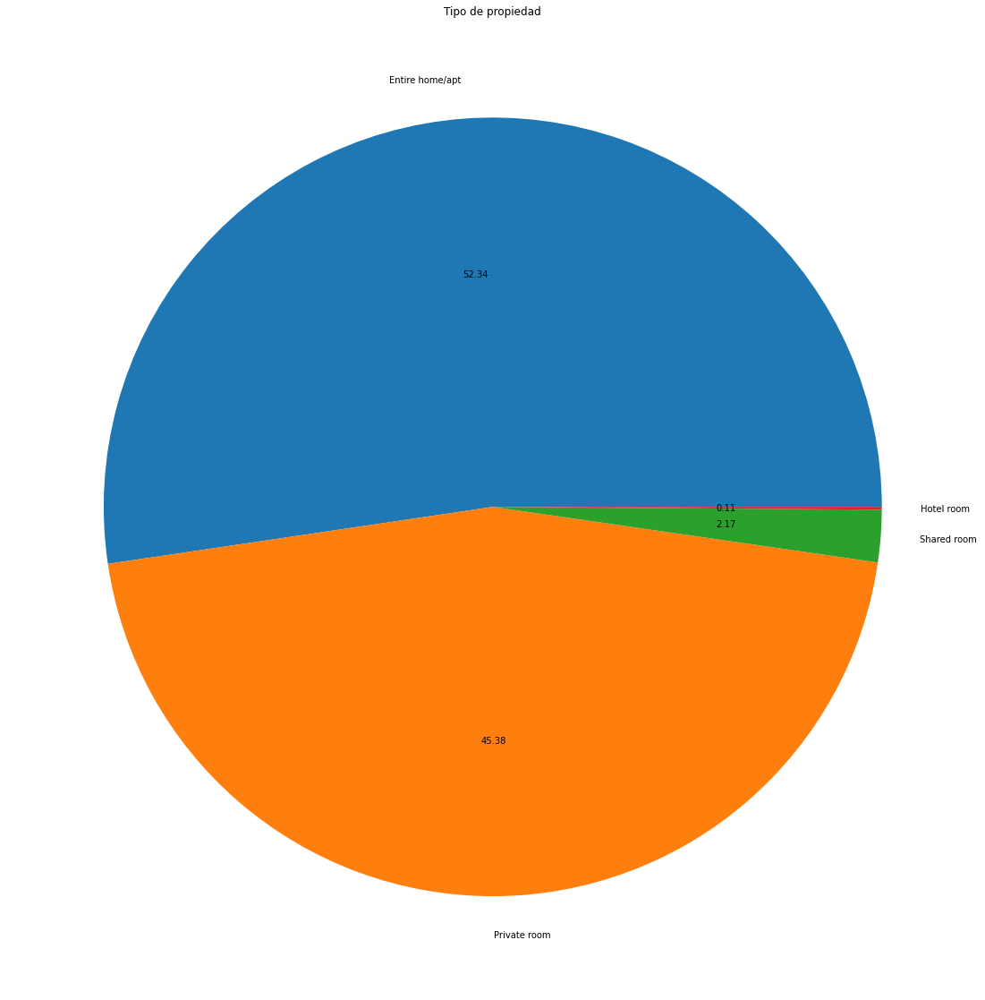

In [72]:
# Distribucion por tipo de propiedad
data['room type'].value_counts().plot(kind="pie",title='Tipo de propiedad',figsize=[20,20],autopct="%.2f", label='')
plt.show()

El grafico muestra que casi la totalidad de los avisos son para el departamento completo o habitacion privada. Habitacion compartida y hotel son poco significativos dentro del total

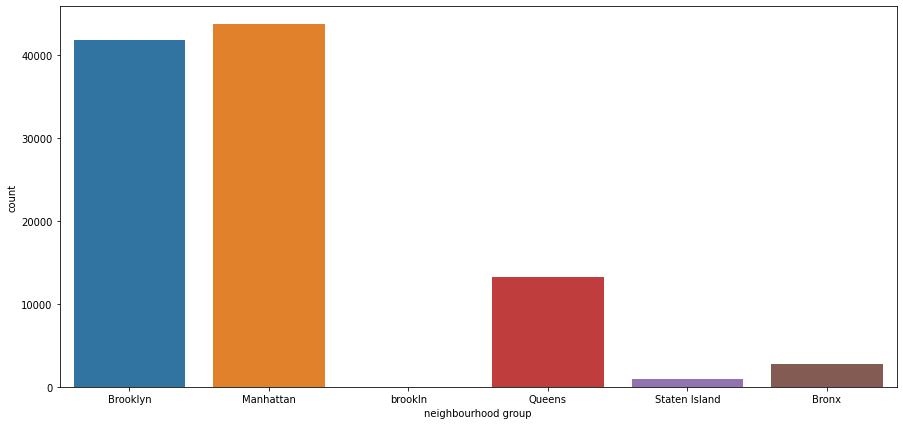

In [73]:
countplt, ax = plt.subplots(figsize = (15,7))
sns.countplot(x='neighbourhood group', data=data)
plt.show()

El grafico de la distribucion por vecindario muestra que la mayor concentracion se encuentra en los barrios de Brooklyn y Manhattan

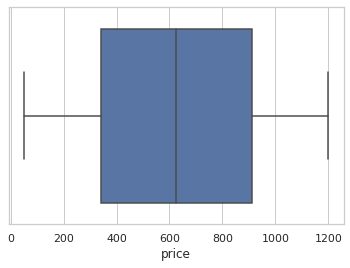

In [74]:
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=data["price"])
plt.show()

La distribucion muestra que los valores se encuentran concentrados y que los valores atipicos no se encuentran tan lejanos a la mayoria de los registros

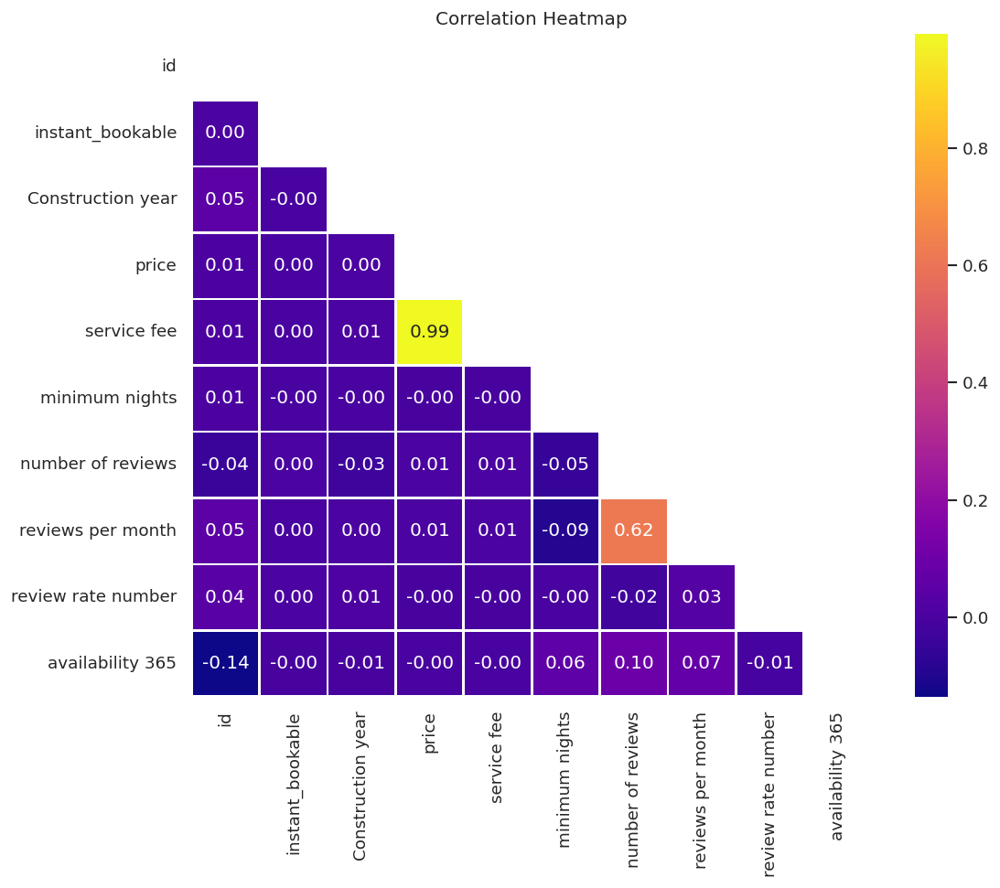

In [75]:
#Correlaciones
plt.figure(dpi = 120,figsize= (10,8))
mask = np.triu(np.ones_like(data.corr(),dtype = bool))
sns.heatmap(data.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

En el grafico de calor podemos ver una relacion directa entre precio y comision. A su vez se ve tambien una dependencia entre numero de reseñas y reseñas por mes, ya que esta ulltima es el total de reseñas divididas por los meses.

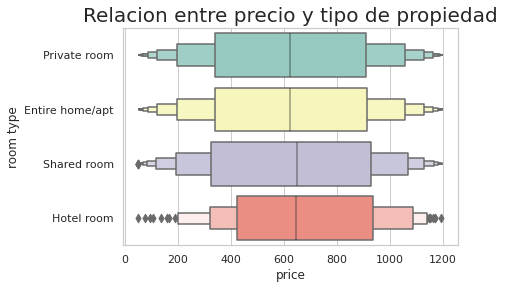

In [76]:
# Relacion entre precio y tipo de propiedad
sns.boxenplot(x=data['price'], y=data['room type'], palette = 'Set3')
plt.title('Relacion entre precio y tipo de propiedad', fontsize = 20, fontweight = 30)
plt.show()

El grafico muestra que la distribucion del precio en los distintos tipos de propiedad es casi la misma, unicamente las habitaciones de hotel tienen una leve diferencia en los precios inferiores

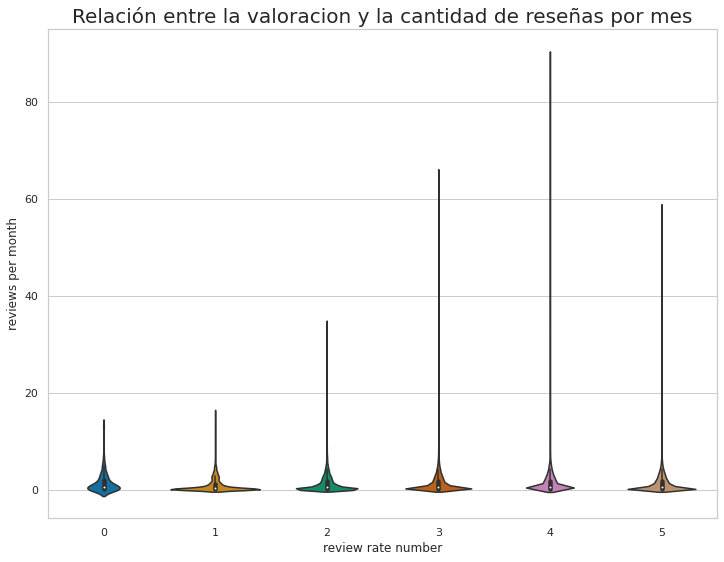

In [77]:
# valoracion vs cantidad de reseñas por mes
plt.rcParams['figure.figsize'] = (12, 9)
sns.violinplot(x=data['review rate number'], y=data['reviews per month'], palette = 'colorblind')
plt.title('Relación entre la valoracion y la cantidad de reseñas por mes', fontsize = 20, fontweight = 30)
plt.show()

El grafico muestra que la distribucion de la mayoria de los valores es similar, encontrandose los valores maximos de las mejores reseñas significativamente por encima de las reseñas negativas

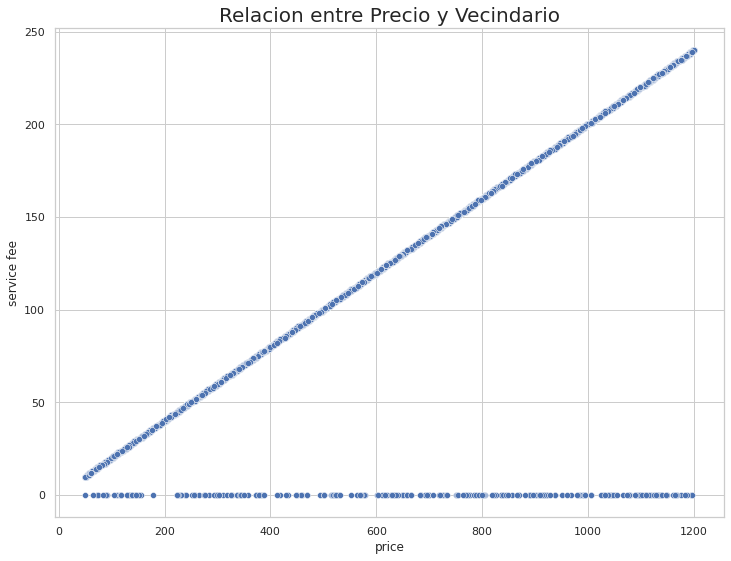

In [78]:
sns.scatterplot(x="price", y="service fee", data=data)
plt.title('Relacion entre Precio y Vecindario', fontsize = 20, fontweight = 30)
plt.show()

El grafico muestra la relacion directa entre precio y comision asi como los valores faltantes en la data original de esta ultima

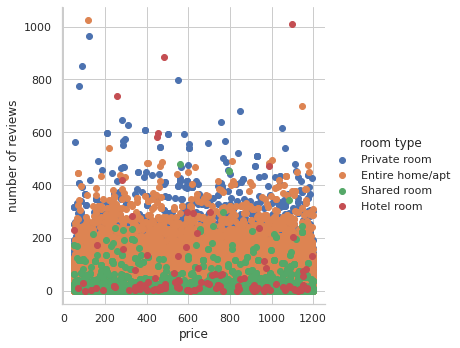

In [79]:
sns.FacetGrid(data,hue = 'room type' , height = 5).map(plt.scatter,'price','number of reviews').add_legend();
plt.show()

El grafico muestra que las habitaciones de hotel reciben la menor cantidad de reseñas, seguidas por las habitaciones compartidas. El precio no parece tener impacto en la catidad de reseñas

<Figure size 2400x1800 with 0 Axes>

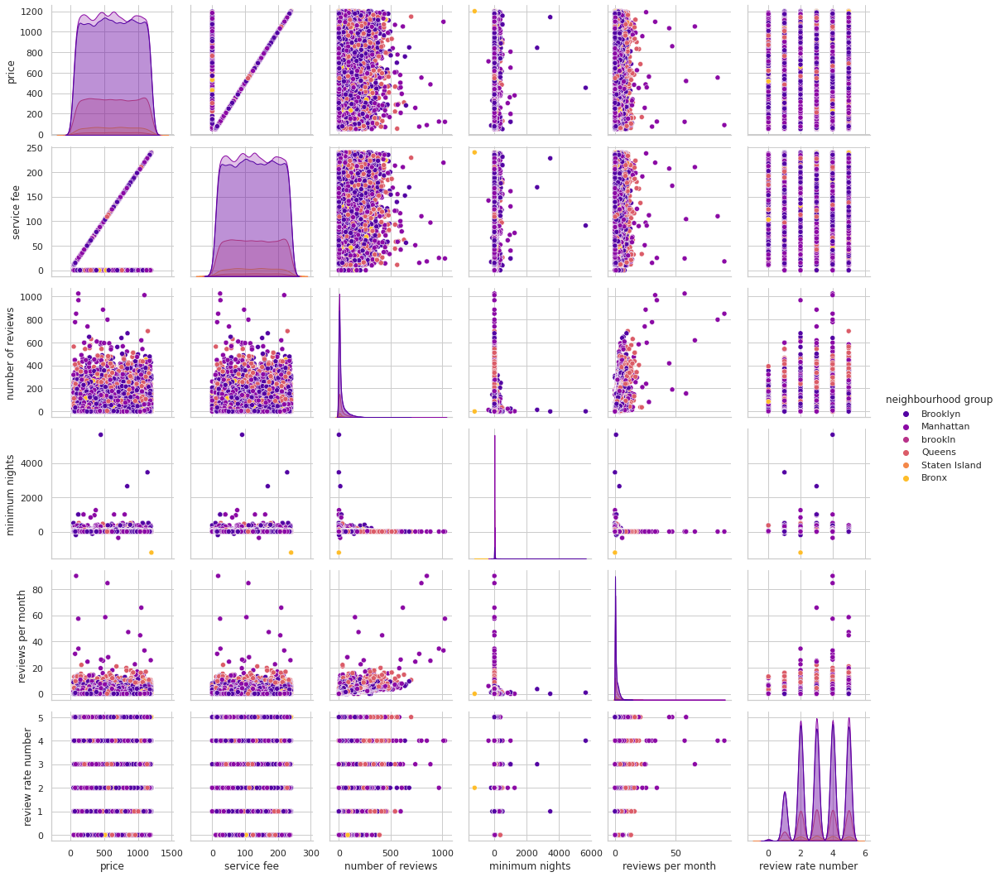

In [80]:
#Crear el Pairplot con el atributo hue = 'neighbourhood group'.
data2=data[['price','room type', 'neighbourhood group', 'service fee', 'number of reviews','cancellation_policy','minimum nights','reviews per month','review rate number']]
plt.figure(dpi = 120,figsize= (20,15))
sns.pairplot(data=data2,hue = 'neighbourhood group',palette = 'plasma')
plt.show()

El grafico muestra la relacion vista anteriormente entre precio y comision, asi como tambien entre el numero de reseñas y las reseñas por mes. Los graficos de noches minimas muestran que la mayoria de los registros no lo exigen

## Machine Learning

### Algoritmo de clasificacion I

In [81]:
#Sepero en X e y

X = data.drop(["price"], axis=1) #Elimino de mi dataset la variable a predecir
y = data.price #Defino el Target

In [82]:
y=pd.cut(y, bins=4,labels=['Bajo','Medio bajo','Medio alto','Alto'])


In [83]:
#Utilizo label Encoder para las variables categoricas
le = preprocessing.LabelEncoder()
for column_name in X.columns:
    if X[column_name].dtype == 'string':
        X[column_name] = le.fit_transform(X[column_name])
    else:
        pass

In [84]:
#Me quedo con 30% para test y 70% para train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42) 

In [85]:
#Utilizo label Encoder para las variables categoricas
le = preprocessing.LabelEncoder()
for column_name in X_train.columns:
    if X_train[column_name].dtype == 'string':
        X_train[column_name] = le.fit_transform(X_train[column_name])
    else:
        pass
    


In [86]:
#Utilizo label Encoder para las variables categoricas
for column_name in X_test.columns:
    if X_test[column_name].dtype == 'string':
        X_test[column_name] = le.fit_transform(X_test[column_name])
    else:
        pass

In [87]:
#Transformo fechas a numero
X_train['last review']=X_train['last review'].map(dt.datetime.toordinal)
X_test['last review']=X_test['last review'].map(dt.datetime.toordinal)

In [88]:
resultados = pd.DataFrame(columns=['Algoritmo','Accuracy'])

In [89]:
X_combined = np.r_[X_train, X_test]
y_combined = np.r_[y_train, y_test]

## Decision Classifier

In [90]:
#Creo el modelo
tree = DecisionTreeClassifier(max_depth=10, random_state=42) 

In [91]:
#Entreno el modelo
tree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=10, random_state=42)

In [92]:
y_train_pred = tree.predict(X_train) #Prediccion en Train
y_test_pred = tree.predict(X_test) #Prediccion en Test

In [93]:
#Calculo el accuracy en Train
train_accuracy = accuracy_score(y_train, y_train_pred)

#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de entrenamiento:', train_accuracy)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de entrenamiento: 0.9986737400530504
% de aciertos sobre el set de evaluación: 0.9970683084139549


In [94]:
#Cross Validation
scores = cross_val_score(tree, X_combined, y_combined, cv=5)
scores

array([0.99574905, 0.99672628, 0.99731262, 0.99692172, 0.99682385])

[[7729    5    7    6]
 [   3 7650    4    3]
 [   6    3 7559   33]
 [   2    6   12 7671]]


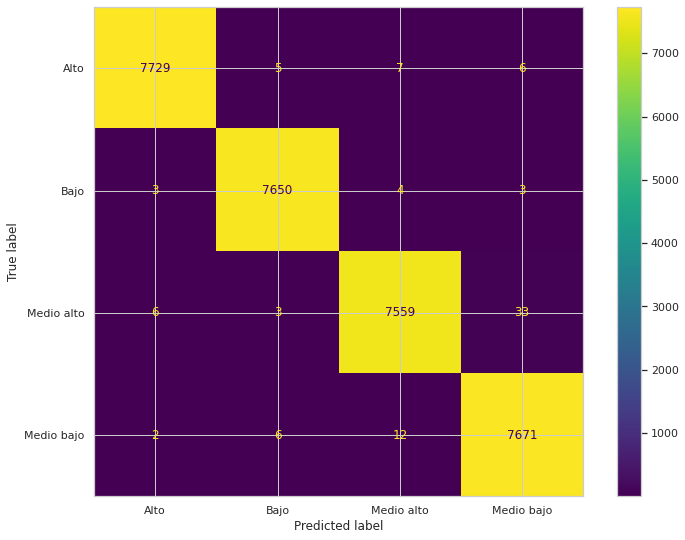

In [95]:
#Matriz de Confusión
cm=confusion_matrix(y_test, y_test_pred)
print(cm)

#Ploteamos la Matriz

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=tree.classes_)
disp.plot()
plt.show()

In [96]:
# Precision!
print(f"Precision Score of the classifier is: {precision_score(y_test, y_test_pred,average='weighted')}")

Precision Score of the classifier is: 0.9970702472329876


In [97]:
# Recall
print(f"Recall Score of the classifier is: {recall_score(y_test, y_test_pred,average='weighted')}")

Recall Score of the classifier is: 0.9970683084139549


In [98]:
# Calculo del F1 score
print(f"F1 Score of the classifier is: {f1_score(y_test, y_test_pred,average='weighted')}")

F1 Score of the classifier is: 0.9970683143485223


In [99]:
resultados = pd.concat([resultados, pd.DataFrame.from_records([{ 'Algoritmo': 'Decision Classifier', 'Accuracy': test_accuracy }])])

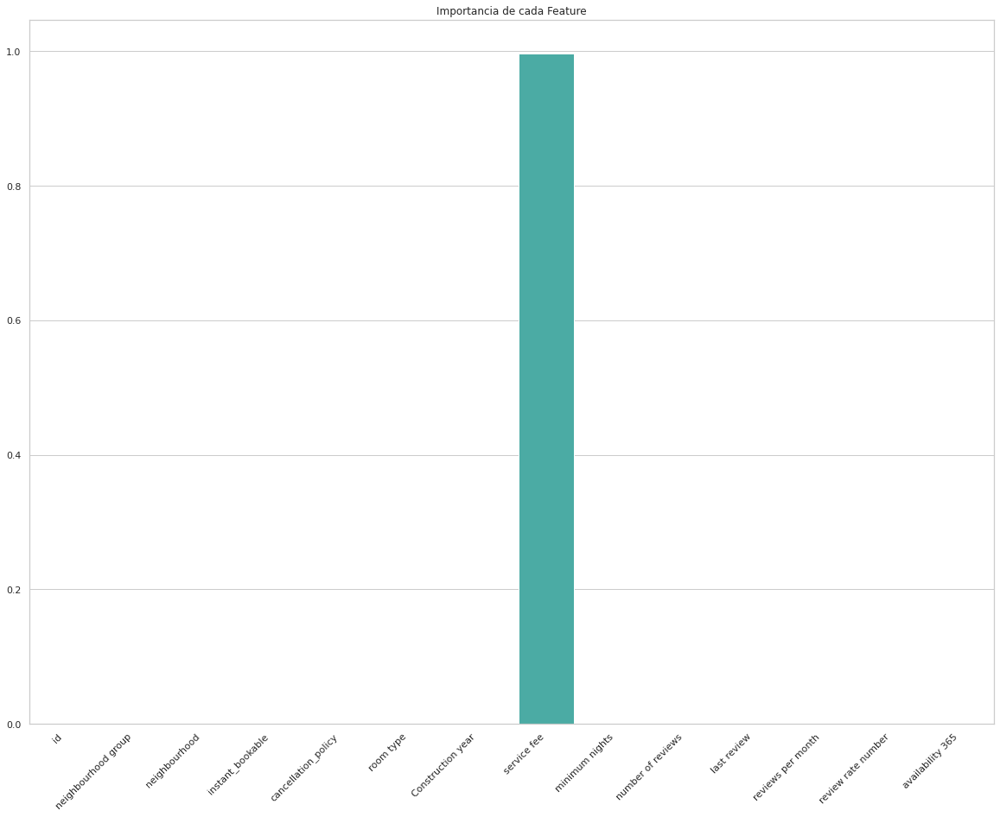

In [100]:
#Importancia de las variables


plt.figure(figsize=(20,15))
importances = tree.feature_importances_
columns = X.columns
sns.barplot(x=columns, y=importances)
plt.title('Importancia de cada Feature')
_ = plt.xticks(rotation=45, ha='right')
plt.show()

El metodo de Arbol de decision de clasificacion es apropiado para este dataset pero se basa exclusivamente en la relacion entre el precio y la comision

## KNN

In [101]:
#Calculo del porcentaje de error para determinar el numero optimo de vecinos
error_rate = []
for i in range(1,40):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

Minimum error:- 0.7305449688914948 at K = 1


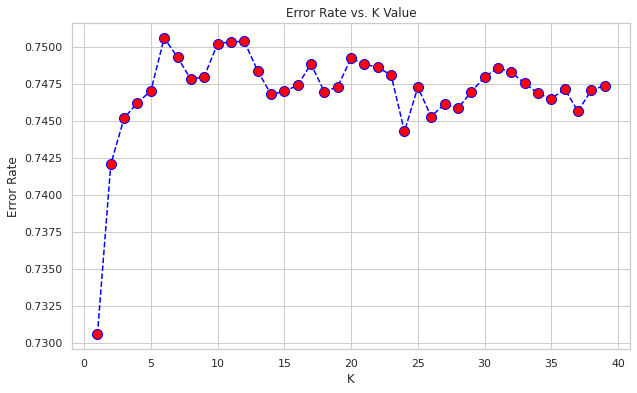

In [102]:
#Grafico porcentaje de error de los diferentes K
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed',marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
req_k_value = error_rate.index(min(error_rate))+1
print("Minimum error:-",min(error_rate),"at K =",req_k_value)

In [103]:
#Crear modelo, entrenarlo y  predecir

knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X_train,y_train)

y_pred_knn = knn.predict(X_test)

test_accuracy_knn=metrics.accuracy_score(y_test, y_pred_knn)

In [104]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",test_accuracy_knn)

Accuracy: 0.26945503110850516


In [105]:
#Cross Validation
scores = cross_val_score(knn, X_combined, y_combined, cv=5)
scores

array([0.27196326, 0.27494381, 0.27083944, 0.27445519, 0.26850721])

In [106]:
resultados = pd.concat([resultados, pd.DataFrame.from_records([{ 'Algoritmo': 'KNN', 'Accuracy': test_accuracy_knn }])])

## Random Forest

In [107]:
#Creamos un arbol de decisión sencillo y lo fiteamos
tree = DecisionTreeClassifier(random_state=11)
tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=11)

In [108]:
y_test_pred_tc = tree.predict(X_test) #Prediccion en Test

In [109]:
#Calculo el accuracy en Test
test_accuracy_tc = accuracy_score(y_test, y_test_pred_tc)

print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.9970683084139549


In [110]:
#Creamos un random forest!
model = RandomForestClassifier(random_state=11, n_estimators=200,
                               class_weight="balanced", max_features="log2")
model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_features='log2',
                       n_estimators=200, random_state=11)

In [111]:
y_test_pred_rf = model.predict(X_test) #Prediccion en Test

In [112]:
#Calculo el accuracy en Test
test_accuracy_rf = accuracy_score(y_test, y_test_pred_rf)

print('% de aciertos sobre el set de evaluación:',test_accuracy_rf)

% de aciertos sobre el set de evaluación: 0.9969054366591745


In [113]:
#Cross Validation
scores = cross_val_score(model, X_combined, y_combined, cv=5)
scores

array([0.996824  , 0.99711717, 0.99706831, 0.99677514, 0.99736135])

In [114]:
resultados = pd.concat([resultados, pd.DataFrame.from_records([{ 'Algoritmo': 'Random Forest Classifier', 'Accuracy': test_accuracy_rf }])])

## Regresión Logística

In [115]:
#Creamos una instancia de la Regresión Logística
regresion_logistica = LogisticRegression(multi_class='multinomial', solver='saga',max_iter=10000)

#Entrenamos la regresión logística con los datos de entrenamiento
regresion_logistica.fit(X_train, y_train)

LogisticRegression(max_iter=10000, multi_class='multinomial', solver='saga')

In [116]:
y_test_pred_reg = regresion_logistica.predict(X_test) #Prediccion en Test

In [117]:
#Calculo el accuracy en Test
test_accuracy_reg = accuracy_score(y_test, y_test_pred_reg)

print('% de aciertos sobre el set de evaluación:',test_accuracy_reg)

% de aciertos sobre el set de evaluación: 0.2519951789960585


In [118]:
#Cross Validation
scores = cross_val_score(regresion_logistica, X_combined, y_combined, cv=5)
scores

array([0.26512264, 0.25935698, 0.28496042, 0.2702531 , 0.25277303])

In [119]:
resultados = pd.concat([resultados, pd.DataFrame.from_records([{ 'Algoritmo': 'Regresión Logística', 'Accuracy': test_accuracy_reg }])])

## Support Vector Machines

In [120]:
# Creación del modelo SVM 
#modelo_SVC = SVC(C = 100, kernel = 'linear', random_state=123)
#modelo_SVC.fit(X_train, y_train)

In [121]:
#Predicciones!
#y_train_pred_SVC = modelo_SVC.predict(X_train)
#y_test_pred_SVC = modelo_SVC.predict(X_test)

In [122]:
#Calculo el accuracy en Train
#train_accuracy_SVC = accuracy_score(y_train, y_train_pred_SVC)

#print('% de aciertos sobre el set de evaluación:',train_accuracy_SVC)

In [123]:
#Calculo el accuracy en Test
#test_accuracy_SVC = accuracy_score(y_test, y_test_pred_SVC)

#print('% de aciertos sobre el set de evaluación:',test_accuracy_SVC)

In [124]:
#Cross Validation
#scores = cross_val_score(modelo_SVC, X_combined, y_combined, cv=5)
#scores

In [125]:
#resultados = pd.concat([resultados, pd.DataFrame.from_records([{ 'Algoritmo': 'Support Vector Machines', 'Accuracy': test_accuracy_SVC }])])

Eleccion modelo

Dado que precio es una variable continua seria mas apropiado para su prediccion el uso de un modelo de regresion en lugar de clasificacion. Para obtener un porcentaje razonable de aciertos para los distintos modelos transforme la variable objetivo en categorica, distribuyendo en 4 categorias distintas (bajo, medio bajo, medio alto, alto).
El modelo de regresion logistica no es apropiado para aplicar al problema actual ya que tiene un porcentaje muy bajo de acierto por lo que muestra que la variable no tiene un comportamiento lineal, ademas hay modelos con mejores desempeños cuando hay mas de dos categorias como en este caso.
A su vez el modelo KNN no obtiene buenos resultados, aun calculando con el numero de vecinos de menor margen de error, el desempeño no es bueno.
Random forest es el apropiado para este analisis y obtiene el mayor resultado.

## Algoritmos de regresion

In [126]:
y_reg = data.price #Defino el Target

In [127]:
X2 = X.drop(["last review"], axis=1)

In [128]:
#Me quedo con 30% para test y 70% para train
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y_reg, test_size=0.30, random_state=42) 

In [157]:
resultados_reg = pd.DataFrame(columns=['Algoritmo','Accuracy'])

## Random Forest

In [130]:
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0)

In [131]:
regressor.fit(X_train2, y_train2)

RandomForestRegressor(n_estimators=10, random_state=0)

In [132]:
# Predicting the target values of the test set
y_pred_reg = regressor.predict(X_test2)

# RMSE (Root Mean Square Error)
rmse = float(format(np.sqrt(mean_squared_error(y_test2, y_pred_reg)), '.3f'))
print("\nRMSE: ", rmse)


RMSE:  17.28


In [133]:
# Evaluating the model using R² Evaluation Metric
r2_rf=r2_score(y_test2, y_pred_reg)
print(r2_rf)

0.997300584387147


In [134]:
#Cross Validation
scores = cross_val_score(regressor, X2, y_reg, cv=5)
scores

array([0.99699015, 0.9981219 , 0.99914265, 0.99400123, 0.99827316])

In [168]:
resultados_reg = pd.concat([resultados_reg, pd.DataFrame.from_records([{ 'Algoritmo': 'Random Forest Regression', 'Accuracy': r2_rf }])])

## Support Vector Regression

In [136]:
#regressor_SVR = SVR(kernel = 'rbf')

In [137]:
#regressor_SVR.fit(X_train2, y_train2)

In [138]:
#y_pred_SVR = regressor_SVR.predict(X_test2)

In [139]:
#Calculo el accuracy en Test
#test_accuracy_SVR = accuracy_score(y_test2, y_pred_SVR)

In [140]:
# RMSE (Root Mean Square Error)
#rmse = float(format(np.sqrt(mean_squared_error(y_test2, y_pred_SVR)), '.3f'))
#print("\nRMSE: ", rmse)

In [141]:
# Evaluating the model using R² Evaluation Metric
#r2_SVR=r2_score(y_test2, y_pred_SVR)
#print(r2_SVR)

In [142]:
#Cross Validation
#scores = cross_val_score(regressor_SVR, X_combined, y_combined, cv=5)
#scores

In [143]:
#resultados_reg = pd.concat([resultados, pd.DataFrame.from_records([{ 'Algoritmo': 'Support Vector Regression', 'Accuracy': r2_SVR }])])

## Simple Linear Regression

In [144]:
# create linear regression object
reg = linear_model.LinearRegression()

In [146]:
# train the model using the training sets
reg.fit(X_train2, y_train2)

LinearRegression()

In [147]:
y_pred_SLR = reg.predict(X_test2)

In [149]:
# RMSE (Root Mean Square Error)
rmse = float(format(np.sqrt(mean_squared_error(y_test2, y_pred_SLR)), '.3f'))
print("\nRMSE: ", rmse)


RMSE:  36.84


In [150]:
# Evaluating the model using R² Evaluation Metric
r2_SLR=r2_score(y_test2, y_pred_SLR)
print(r2_SLR)

0.9877309981355061


In [153]:
#Cross Validation
scores = cross_val_score(reg, X2, y_reg, cv=5)
scores

array([0.98499845, 0.98860272, 0.99597699, 0.97616467, 0.99453564])

In [169]:
resultados_reg = pd.concat([resultados_reg, pd.DataFrame.from_records([{ 'Algoritmo': 'Simple Linear Regression', 'Accuracy': r2_SLR }])])

In [155]:
resultados

,Algoritmo,Accuracy
0,Decision Classifier,0.997068
0,KNN,0.269455
0,Random Forest Classifier,0.996905
0,Regresión Logística,0.251995


In [170]:
resultados_reg

,Algoritmo,Accuracy
0,Random Forest Regression,0.997301
0,Simple Linear Regression,0.987731
